# Algorithmic specified complexity of images

We use the methodology of Ewert, Dembski, and Marks, "[Measuring Meaningful Information in Images: Algorithmic Specified Complexity](http://robertmarks.org/REPRINTS/2015%20Measuring%20meaningful%20information%20in%20images.pdf)," to produce examples countering their claim that algorithmic specified complexity (ASC) is a measure of meaningful information.

Ewert et al

In concrete terms, Ewert et al. cla are saying that an image is meaningful to the degree that a catalog of images can be used to increase the compression of it. 

Basically, Ewert et al. have equated meaningful information with relative compressibility. That is, ASC is very similar to the algorithmic mutual information of binary strings $x$ and $c,$

$$I_K(x; c) = K_U(x) - K_U(x|c),$$

where $K_U(x|c)$ is the minimum length of a program for universal computer $U$ that outputs $x$ on input of $c,$ and $K(x) = K(x|\lambda)$ is the minimum length of a program for $U$ that outputs $x$ on input of the empty string $\lambda.$ An important point, in present context, is that the programs for $U$ are self-delimiting, which is to say that none is a proper prefix of another.

Ewert et al. approximate the ASC of an image $X,$

$$\text{ASC}(X) = I(X) - K_U(X|C) \text{ bits,}$$

by taking the difference of its size in two encodings. The value of $I(X)$ is approximated by the length of $X$ when stored in Portable Network Graphics (PNG) format. Note that the PNG standard does not specify a compression algorithm, and that the size of an image in PNG format may vary considerably from one implementation to another of the encoder.

one of which is depends only the image, and the other of which depends on both the image and a catalog of images. The generic encoding of the image is obtained by storing it in a Portable Network Graphics (PNG) file, and then stripping the 8-byte signature. Note that the PNG standard allows for compression of the image to be done in various ways: there is no standard compression algorithm for PNG. The custom encoding is a program for a given computer that, on input of a particular catalog of images, outputs the image. Ideally, the program would be the shortest of all programs that output the image on input of the catalog, but, as a consequence of the Halting Problem, there exists no algorithm for absolute minimization of program length. 

That is, for image $X,$

$$\text{ASC}(X) \approx \text{PNG_length}(X) - \text{program_length}(X|C).$$

where $C$ is the catalog of images input to the program. The smaller the program length, the better the approximation. This quantity differs by an additive constant from a similar approximation of the algorithmic mutual information of $X$ and $C.$ 

The difference of this quantity and a similar approximation of the algorithmic mutual information of $X$ and $C,$

$$I(X; C) \approx \text{self_extracting_PNG_length}(X) - \text{program_length}(X|C),$$

is bounded by a constant. That is, any PNG image can be converted into a self-extracting archive&nbsp;&mdash; a program that, when run without an input, outputs the image. Because the PNG image is self-delimiting, the amount of code required to turn it into a self-extracting archive does not depend on the size of the image.

The size of the code added to the PNG image does not depend on the size of image because the  difference in size of the self-extracting archive and the PNG image is bounded by a constant $c,$ because the PNG image is self-delimiting. Thus the approximation of ASC differs from a similar approximation of the algorithmic mutual information of $X$ and $C,$


by an additive constant $c.$ Ewert et al. note the similarity of ASC to algorithmic mutual information, but make no mention of the asymptotic equivalence, let alone the burden they bear to justify regarding ASC as a measure of meaningful information.


Note that the ASC may be negative, even if the program length is the least possible for the given computer. Loosely speaking, it may be that $C$ is of no use in compressing $X,$ and that the shortest program outputting $X$ is one that contains the PNG-compressed $X.$

In [1]:
import numpy as np
import io
import imageio
from IPython.display import Image, display

Fetch an [image of Mount Rushmore](https://upload.wikimedia.org/wikipedia/commons/thumb/e/e6/Side_view_of_Washington_at_Mount_Rushmore%2C_SD_IMG_20140311_0001.jpg/1280px-Side_view_of_Washington_at_Mount_Rushmore%2C_SD_IMG_20140311_0001.jpg) (public domain) and an [image of Mount Fuji](https://upload.wikimedia.org/wikipedia/commons/thumb/b/bb/Mount_Fuji_from_space_%28shuttle_mission%29.jpg/1280px-Mount_Fuji_from_space_%28shuttle_mission%29.jpg) (**NEED CREDIT**) from the Wikimedia Commons. The images are converted from JPG to RGB format.

In [2]:
rush_url="https://upload.wikimedia.org/wikipedia/commons/thumb/e/e6/Side_view_of_Washington_at_Mount_Rushmore%2C_SD_IMG_20140311_0001.jpg/1280px-Side_view_of_Washington_at_Mount_Rushmore%2C_SD_IMG_20140311_0001.jpg"
fuji_url="https://upload.wikimedia.org/wikipedia/commons/thumb/b/bb/Mount_Fuji_from_space_%28shuttle_mission%29.jpg/1280px-Mount_Fuji_from_space_%28shuttle_mission%29.jpg"

rush = imageio.imread(rush_url)
fuji = imageio.imread(fuji_url)

The images differ only in their heights:

In [3]:
rush.shape, fuji.shape

((903, 1280, 3), (848, 1280, 3))

Crop the bottom edge of the Rushmore image to make it equal in height to the Fuji image. Then verify that the two images are identical in shape.

In [4]:
rush = rush[:fuji.shape[0]]
rush.shape == fuji.shape

True

Take the bitwise exclusive-or (XOR) of the images. To validate the operation, verify that the two arguments can be recovered form the result. That is, it follows from $x = r \oplus f$ that $x \oplus f = r$ and $x \oplus r = f.$

In [5]:
xor = rush ^ fuji
assert np.array_equal(xor ^ fuji, rush)
assert np.array_equal(xor ^ rush, fuji)

Write the **NEED** to a file in PNG format, and record the number of bits in the [PNG-compressed](https://en.wikipedia.org/wiki/Portable_Network_Graphics#Compression) image.

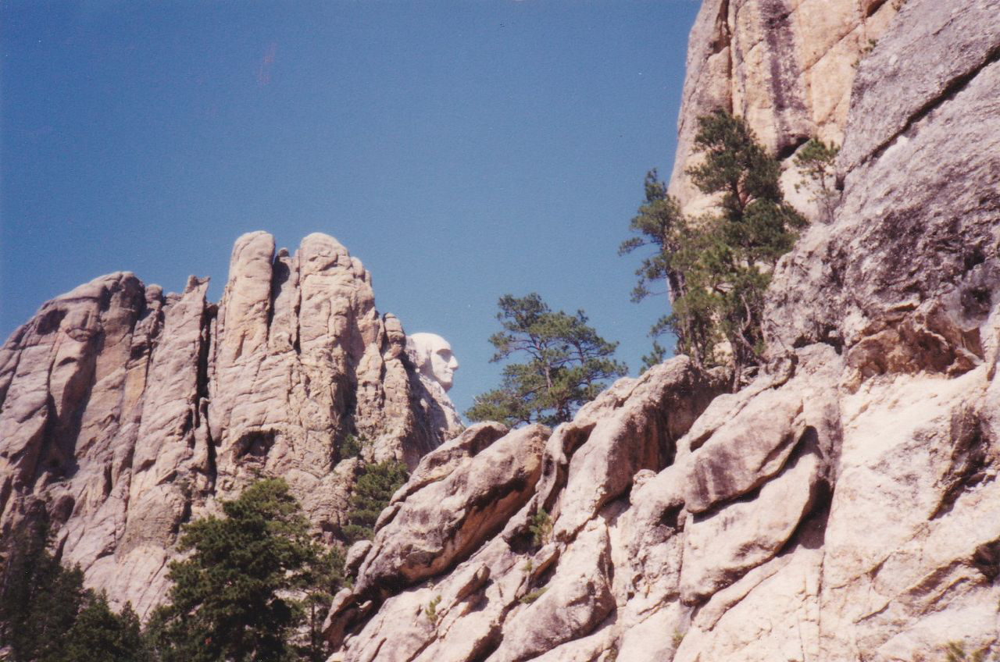

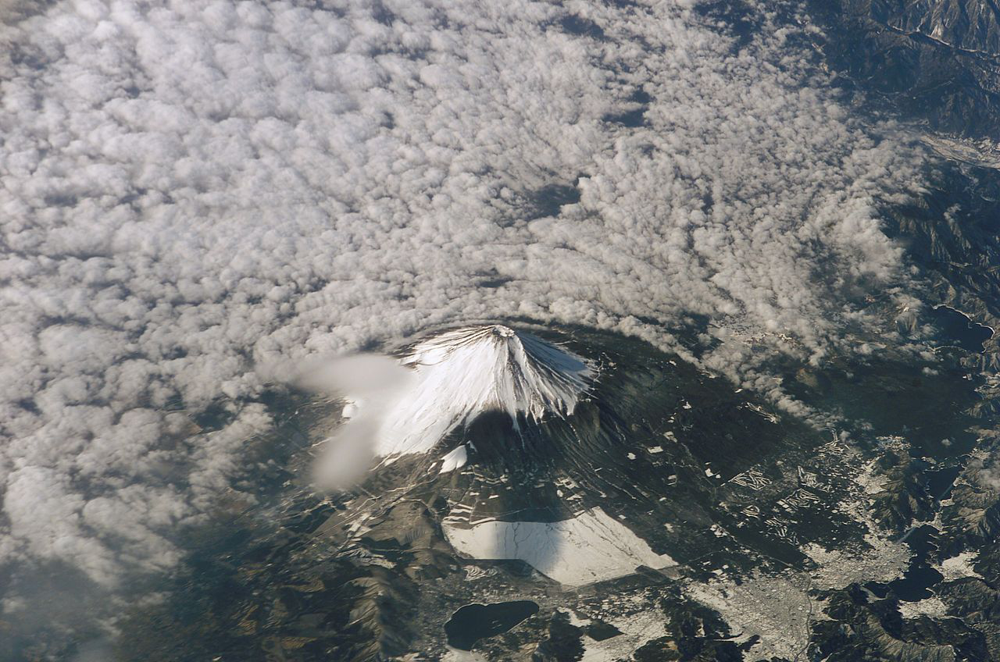

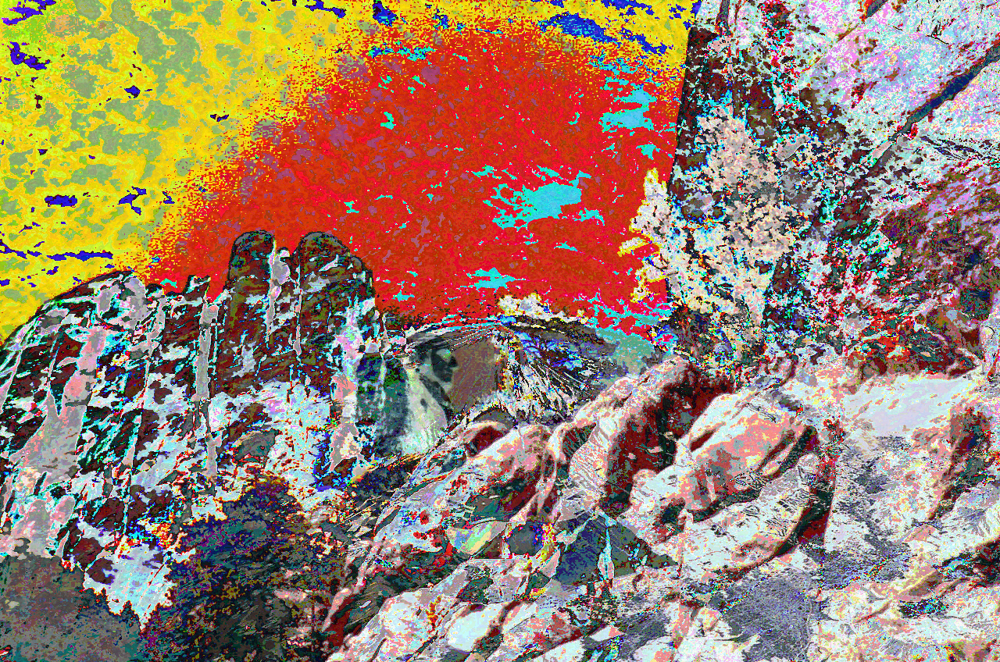

(13046408, 12978728, 22115216)

In [6]:
def write_png(basename, image):
    with io.FileIO(basename + '.png', 'wb') as compressed:
        imageio.imwrite(compressed, image, format='png')
        return 8 * (compressed.tell() - 8) # exclude 8-byte header

n_rush = write_png('rush', rush)
n_fuji = write_png('fuji', fuji)
n_xor = write_png('xor', xor)

display(Image(filename='rush.png'))
display(Image(filename='fuji.png'))
display(Image(filename='xor.png'))

n_rush, n_fuji, n_xor

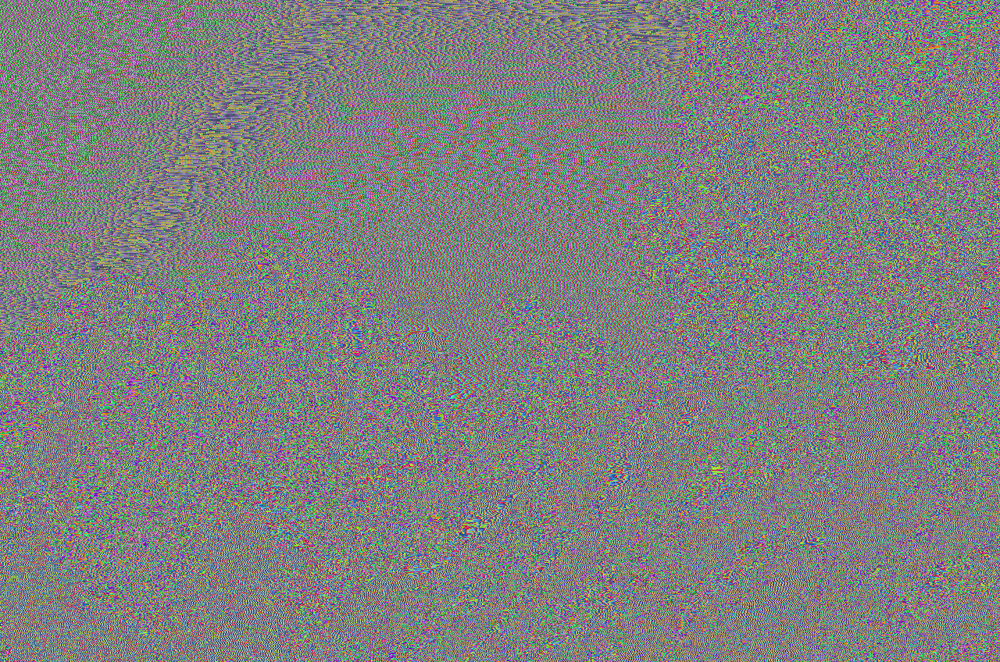

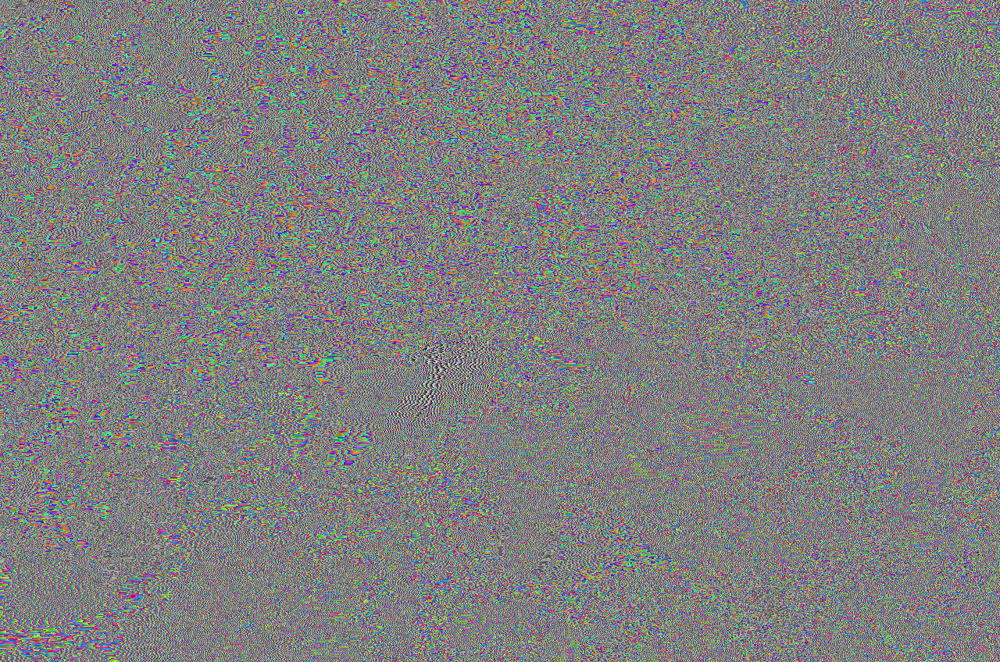

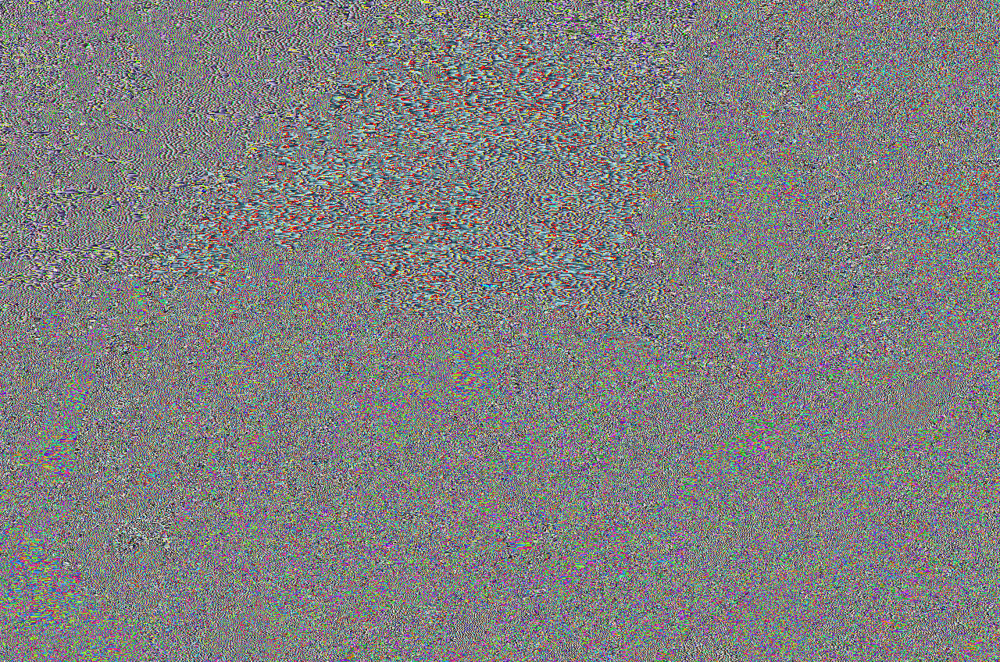

(25270608, 24942664, 25867776)

In [7]:
rush_sum = np.cumsum(rush, dtype=xor.dtype).reshape(rush.shape)
fuji_sum = np.cumsum(fuji, dtype=xor.dtype).reshape(fuji.shape)
xor_sum = np.cumsum(xor, dtype=xor.dtype).reshape(xor.shape)

n_rush_sum = write_png('rush_sum', rush_sum)
n_fuji_sum = write_png('fuji_sum', fuji_sum)
n_xor_sum = write_png('xor_sum', xor_sum)

display(Image(filename='rush_sum.png'))
display(Image(filename='fuji_sum.png'))
display(Image(filename='xor_sum.png'))
n_rush_sum, n_fuji_sum, n_xor_sum

We will approximate the ASC of images in units of megabits ($10^6$ bits, abbreviated Mb). In practice, it is entirely reasonable to suppose that a 0.5-Mb program suffices to extract two images from a given image library, perform simple operations sequentially on the corresponding bits of the images, and output the results of the operations. That is, the Kolmogorov complexity of an image $X,$ conditioned on an image library $C,$ is bounded at

$$K(X|C) \leq 0.5 \text{ Mb}$$

in the cases that we consider. For the image $X$ that we have just generated (the bitwise XOR of the images of Rushmore and Fuji), the size after PNG-compression is

$$I(X) \approx 22.1 \text{ Mb,}$$

and the algorithmic specified complexity is

\begin{align*}
\text{ASC}(X) 
   &= I(X) - K(X|C) \\
   &\geq 22.1 - 0.5 \\
   &= 21.6 \\
   &\approx 22 \text{ Mb.}
\end{align*}


Note that it matters little in this counter&shy;example whether the approximate ASC should have been 21 Mb instead of 22 Mb. The point is that a patently meaningless image, shown below with reduced resolution, has a large quantity of putatively meaningful information. To be clear, Ewert et al. are saying that, to receive the full 22 million bits of meaningful information, we must view the [full-resolution image](rush_XOR_fuji.png) in the context of the images of Rushmore and Fuji.


<p><center>**[Sunset in the Garden of Id](rush_xor_fuji.png)**</center></p>

To check the calculation, we verify that we can recover the image of Fuji by taking the bitwise XOR of the result and the image of Rushmore.

Put simply, the claims of Ewert et al. imply that a meaningless hash of images is much greater in meaningful information than the individual images entering into the hash when it

1. is much less compressible than the individual images, and
2. is generated by a relatively short program.

The XOR hash of images is a good starting point, because it facilitates validation of the image processing. And it has turned out to be highly instructive, inasmuch as the sunset that we see in the result has nothing to do with the meanings of the library images. However, the XOR hash leaves propagandists in the intelligent design movement with an opportunity for rhetorical deflection, precisely because the individual library images are recoverable from the result.

The fact of the matter is that we can generate, with a brutally simple approach, hashes of the *individual* images of Rushmore and Fuji that are much less compressible, and hence much more "meaningful," than the bitwise XOR of the two images. Iterating over the 8-bit RGB values (three per pixel), we accumulate the bitwise XOR of all of the values that have been encountered, including an initalizing value (`0xff`). It is the cumulative XOR (an 8-bit value) that is output for each of the RGB values in the iteration.

What we've just done with the Rushmore image and the Fuji image, we could do also with image `xor` that we previously generated by taking the bitwise XOR of Rushmore and Fuji (and stored in the file named `rush_XOR_fuji.png`). However, I don't want to give the impression that two passes over the data are required. It is very easy to modify the iteration over the corresponding RGB values in one input image and in one output image, and obtain an iteration over the corresponding RBG values in *two* input images and in one output image. The first line in the body of the loop below is an "on the fly" calculation of the bitwise XOR of Rushmore and Fuji.